<a href="https://colab.research.google.com/github/xu62u4u6/palkemon/blob/main/DEA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn
import os
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model
import numpy as np
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Dense, Reshape


def loss_plot(history):
    history = history.history

    # 設置圖表風格
    sns.set(style='whitegrid')

    # 創建子圖
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # 繪製損失圖
    sns.lineplot(ax=axes[0], x=range(1, len(history['loss']) + 1), y=history['loss'], label='Train Loss')
    sns.lineplot(ax=axes[0], x=range(1, len(history['val_loss']) + 1), y=history['val_loss'], label='Validation Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # 繪製準確率圖
    if "loss" in history.keys():
        sns.lineplot(ax=axes[1], x=range(1, len(history['accuracy']) + 1), y=history['accuracy'], label='Train Accuracy')
        sns.lineplot(ax=axes[1], x=range(1, len(history['val_accuracy']) + 1), y=history['val_accuracy'], label='Validation Accuracy')
        axes[1].set_title('Training and Validation Accuracy')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Accuracy')
        axes[1].legend()

        # 顯示圖表
        plt.tight_layout()
        plt.show()


def get_gradcam_heatmap(model, img_array, layer_index):
    # 建立一个模型，将输入图像映射到最后一个卷积层的激活输出以及最终的预测输出

    grad_model = tf.keras.models.Model([model.inputs], [model.layers[layer_index].output, model.output])
    # 计算输入图像对应的最高预测类别对最后一个卷积层激活输出的梯度
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # 计算输出神经元（最高预测类别或选定类别）对最后一个卷积层特征图的梯度
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # 计算每个特征图通道的梯度平均值
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # 将每个通道的特征图乘以对应的梯度平均值，得到加权特征图
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # 为了可视化，将热力图归一化到0和1之间
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def superimpose_heatmap(img, heatmap, alpha=0.4):
    # 调整热力图大小以匹配原始图像大小
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # 将热力图转换为RGB
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # 将灰度图像转换为RGB
    img_rgb = cv2.cvtColor(np.uint8(255 * img), cv2.COLOR_GRAY2RGB)

    # 将热力图叠加到原始图像上
    superimposed_img = cv2.addWeighted(img_rgb, 1-alpha, heatmap, alpha, 0)

    return superimposed_img

def define_model():
    model = Sequential()
    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu',
              input_shape=(64, 64, 1)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer=Adam(),
                loss='categorical_crossentropy',
                metrics=['accuracy'])
    model.summary()
    return model

def preprocess_image(image, size=(64, 64)):
    # 將0值像素設置為255（白色），僅對pal_images進行此操作
    if is_black_ground(image):
        image = np.where(image < 5, 255, image)
    # 調整圖像大小
    resized_image = cv2.resize(image, size)
    # 轉換為灰度圖像
    gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
    return gray_image



def is_black_ground(img, black_ratio=0.25):
    # 獲取圖像邊緣的像素
    top_row = img[0, 1:-1]
    bottom_row = img[-1, 1:-1]
    left_column = img[:, 0]
    right_column = img[:, -1]

    # 統計黑色像素的數量
    black_pixels = np.sum(top_row == 0) + np.sum(bottom_row == 0) + np.sum(left_column == 0) + np.sum(right_column == 0)

    # 計算邊緣總像素數量
    total_edge_pixels = len(top_row) * 4 - 2

    # 如果黑色像素超過總邊緣像素的一半，則去除該圖像
    if black_pixels > int(total_edge_pixels * black_ratio):
        return True
    else:
        return False

from google.colab import drive
drive.mount('/content/drive')
img_dir = "/content/drive/Shareddrives/YU-CHAO WANG LAB/機器學習_陳麗芬/palkemon/images"
os.chdir(img_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dir1 = "pal"
dir2 = "pokemon"

pal_images = []

# 加载“pal”目录中的图像
for filename in os.listdir(dir1):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        filepath = os.path.join(dir1, filename)
        image = cv2.imread(filepath)
        if image is not None:
            pal_images.append(image)
        else:
            print(f"Failed to load image: {filename}")

pokemon_images = []
# 加载“pokemon”目录中的图像
for filename in os.listdir(dir2):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        filepath = os.path.join(dir2, filename)
        image = cv2.imread(filepath)
        if image is not None:
            pokemon_images.append(image)
        else:
            print(f"Failed to load image: {filename}")

# 存入 pickle file
with open('pal_images.pkl', 'wb') as f:
    pickle.dump(pal_images, f)

with open('pokemon_images.pkl', 'wb') as f:
    pickle.dump(pokemon_images, f)



FileNotFoundError: [Errno 2] No such file or directory: 'pal'

Mounted at /content/drive


### 讀取Pickle

總圖像數量: 1164


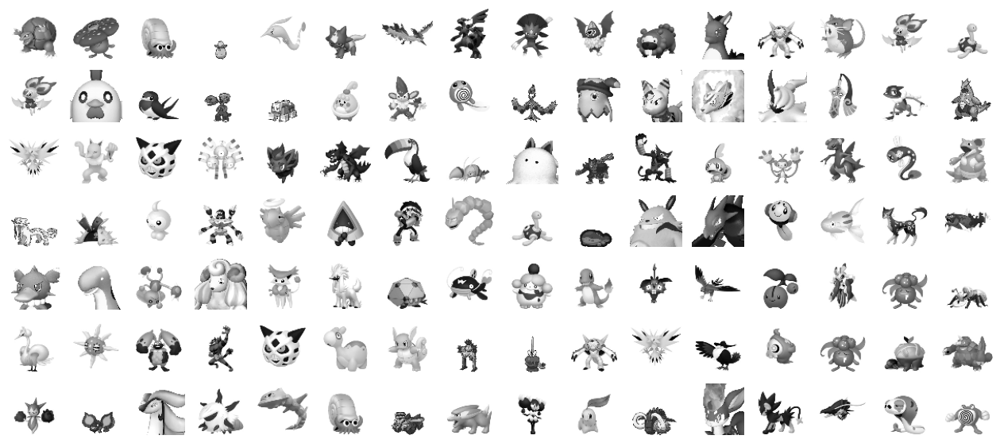

In [ ]:
# 從 Pickle 文件中讀取數據
with open('pal_images.pkl', 'rb') as f:
    pal_images = pickle.load(f)

with open('pokemon_images.pkl', 'rb') as f:
    pokemon_images = pickle.load(f)

# 預處理圖像並標籤 pal(0), pokemon(1)
image_list = [preprocess_image(img) for img in pal_images] + \
        [preprocess_image(img) for img in pokemon_images]
label_list = [0] * len(pal_images) + [1] * len(pokemon_images)

# 篩選黑底的pokemon資料
print(f"總圖像數量: {len(image_list)}")

# 隨機繪製一些圖形
fig, ax = plt.subplots(7, 16, figsize=(16, 7))
for i in range(7):
    for j in range(16):
        idx = np.random.randint(0, len(image_list))
        ax[i][j].imshow(image_list[idx], cmap='gray')
        ax[i][j].axis('off')
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

X = np.array(image_list)
y = np.array(label_list) #np.expand_dims(np.array(label_list), -1)

#np.array(image_list), -1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, stratify=label_list, random_state=42)

pal_train_X = np.expand_dims(train_X[train_y == 0], -1)
pokemon_train_X = np.expand_dims(train_X[train_y == 1], -1)

datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.7, 1.3])

datagen.fit(pal_train_X)
pal_train_X_gen = datagen.flow(pal_train_X, batch_size=2000).next()
pokemon_train_X_gen = datagen.flow(pokemon_train_X, batch_size=1000).next()

train_X_gen = np.concatenate([pal_train_X, pal_train_X_gen, pokemon_train_X, pokemon_train_X_gen])
train_y_gen = np.concatenate([
    np.repeat(0, len(pal_train_X)),
    np.repeat(0, len(pal_train_X_gen)),
    np.repeat(1, len(pokemon_train_X)),
    np.repeat(1, len(pokemon_train_X_gen))
])

In [ ]:
# 对 pal 图像进行增强
pal_images_augmented = []
pal_labels_augmented = []

# 生成多批增强后的样本
num_samples_per_image = 5  # 每张图像生成多少个样本，可以根据需要调整

for img in pal_train_X:
    img = np.expand_dims(img, axis=0)
    for _ in range(20):
        batch = datagen.flow(img, batch_size=1).next()
        pal_images_augmented.append(batch[0])
        pal_labels_augmented.append(0)

# 对 pokemon 图像进行增强
pokemon_images_augmented = []
pokemon_labels_augmented = []

for img in pokemon_train_X:
    img = np.expand_dims(img, axis=0)
    for _ in range(5):
        batch = datagen.flow(img, batch_size=1).next()
        pokemon_images_augmented.append(batch[0])
        pokemon_labels_augmented.append(1)

# 将增强的图像与原始图像合并
train_X_augmented = np.concatenate([pal_train_X, pal_images_augmented, pokemon_train_X, pokemon_images_augmented])
train_y_augmented = np.concatenate([
    np.repeat(0, len(pal_train_X)),
    np.repeat(0, len(pal_images_augmented)),
    np.repeat(1, len(pokemon_train_X)),
    np.repeat(1, len(pokemon_images_augmented))
])
# 打印增强后的训练集数量
print(f"增强后的训练集图像数量: {len(train_X_augmented)}")

# 确保测试集数据形状正确
test_X = np.expand_dims(test_X, -1)  # 根据需要扩展维度

# 检查数据集形状
print(f"训练集图像形状: {train_X_augmented.shape}")
print(f"测试集图像形状: {test_X.shape}")
print(f"训练集标签形状: {train_y_augmented.shape}")
print(f"测试集标签形状: {test_y.shape}")


增强后的训练集图像数量: 7251
训练集图像形状: (7251, 64, 64, 1)
测试集图像形状: (233, 64, 64, 1)
训练集标签形状: (7251,)
测试集标签形状: (233,)


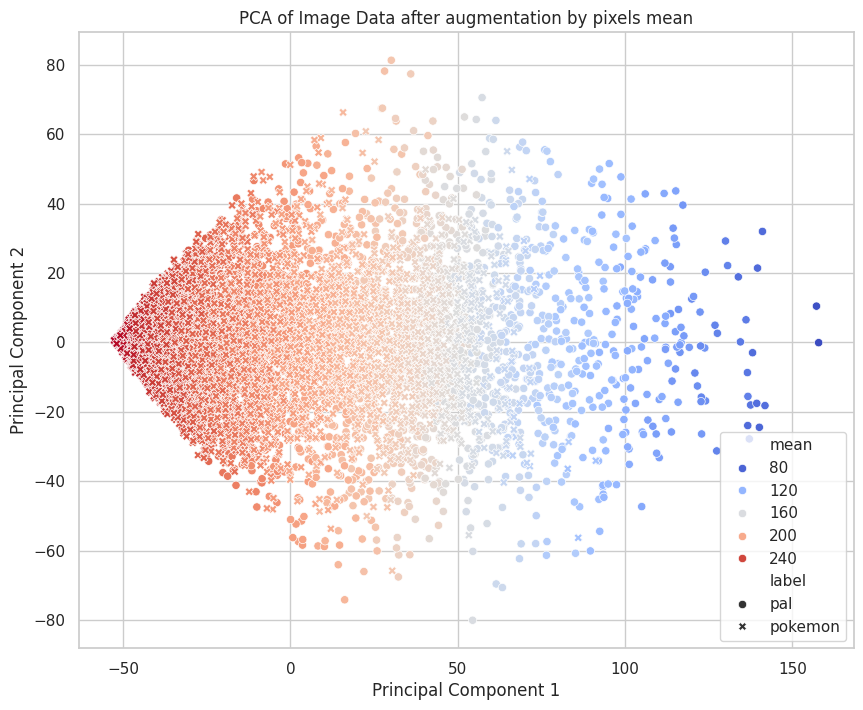

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
X, y = train_X_augmented, train_y_augmented

# 將每張圖片展平
X_flattened = X.reshape(X.shape[0], -1)

# 標準化數據
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_flattened)

# 進行PCA
pca = PCA(n_components=2)  # 降維到2個主成分
X_pca = pca.fit_transform(X_scaled)

# 將PCA結果轉換為DataFrame
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['label'] = np.where(y==0, "pal", "pokemon")
pca_df['mean'] = X.mean(axis=(1, 2))

# 繪製散點圖
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='mean', palette='coolwarm', style='label', legend="brief")
plt.title('PCA of Image Data after augmentation by pixels mean')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')#
plt.show()

In [ ]:
#train_X_augmented, train_y_augmented

# 送進模型前處理
blurred_train_X_list = []
for img in train_X_augmented:
    blurred_train_X_list.append(cv2.GaussianBlur(img, (5, 5), 0))

blurred_test_X_list = []
for img in test_X:
    blurred_test_X_list.append(cv2.GaussianBlur(img, (5, 5), 0))

blurred_train_X = np.array(blurred_train_X_list)
blurred_test_X = np.array(blurred_test_X_list)

scaled_blurred_train_X = blurred_train_X/255
scaled_blurred_test_X = blurred_test_X/255

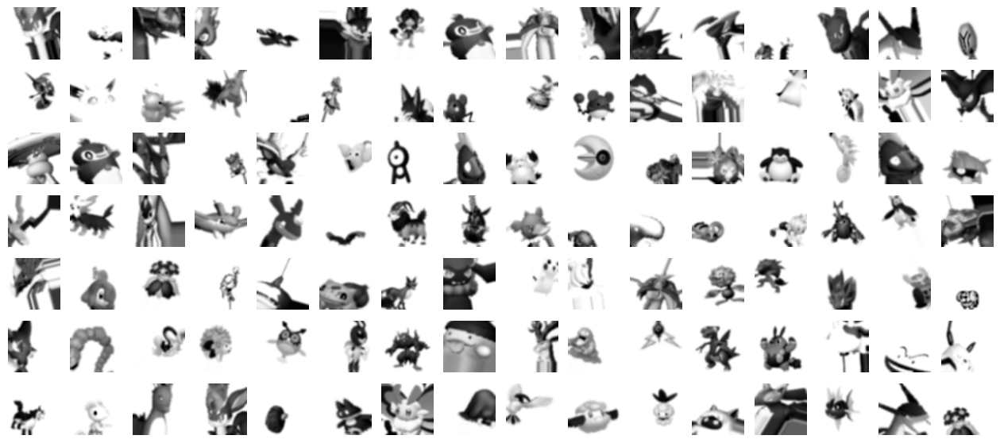

In [ ]:
# 隨機繪製一些模糊的augmentation圖形
fig, ax = plt.subplots(7, 16, figsize=(16, 7))
for i in range(7):
    for j in range(16):
        idx = np.random.randint(0, len(blurred_train_X_list))
        ax[i][j].imshow(blurred_train_X_list[idx], cmap='gray')
        ax[i][j].axis('off')
plt.show()

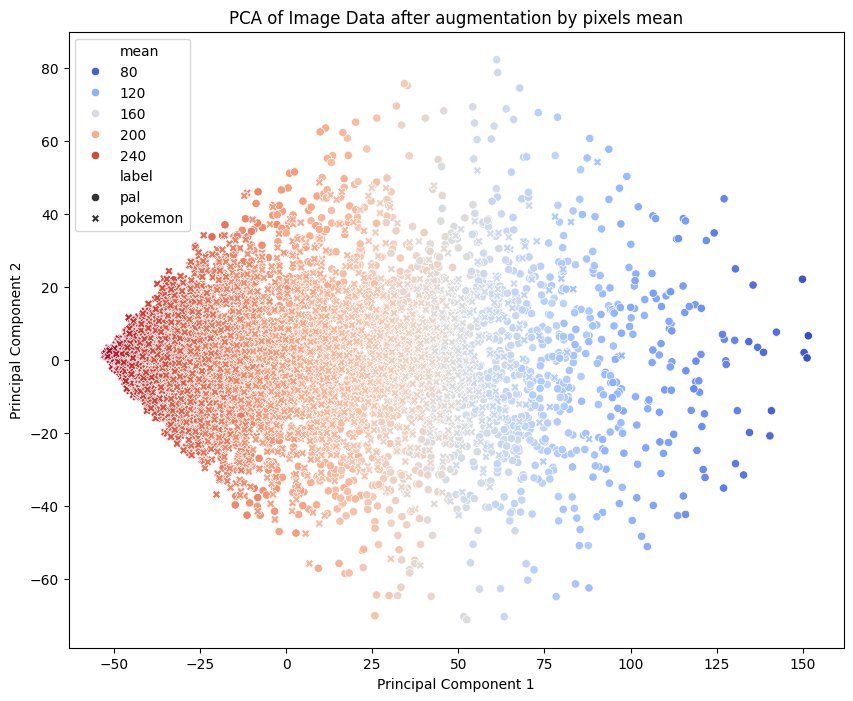

In [ ]:
# 繪製散點圖
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='mean', palette='coolwarm', style='label', legend="brief")
plt.title('PCA of Image Data after augmentation by pixels mean')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')#
#plt.legend(title='Label', {"x":"pokemon", "*":"pal"})
plt.show()

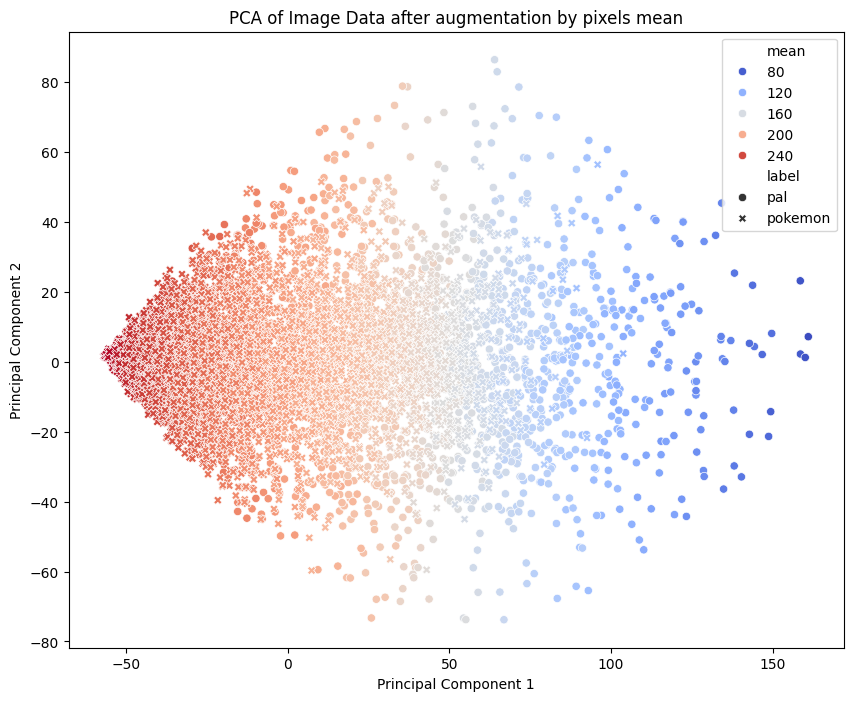

In [ ]:
X, y = blurred_train_X, train_y_augmented

# 將每張圖片展平
X_flattened = X.reshape(X.shape[0], -1)

# 標準化數據
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_flattened)

# 進行PCA
pca = PCA(n_components=2)  # 降維到2個主成分
X_pca = pca.fit_transform(X_scaled)

# 將PCA結果轉換為DataFrame
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['label'] = np.where(y==0, "pal", "pokemon")
pca_df['mean'] = X.mean(axis=(1, 2))

# 繪製散點圖
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='mean', palette='coolwarm', style='label', legend="brief")
plt.title('PCA of Image Data after augmentation by pixels mean')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')#
plt.show()

In [ ]:
train_y_augmented.shape

(7251, 64, 64)

In [ ]:
# 高斯模糊
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

one_hot_y = tf.keras.utils.to_categorical(train_y_augmented, 2)

# define model
model = define_model()
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
history = model.fit(scaled_blurred_train_X, one_hot_y, epochs=10, batch_size=50, validation_split=0.2, callbacks=[early_stopping])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 62, 62, 128)       1280      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 31, 31, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 29, 29, 64)        73792     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 14, 14, 64)        0         
 g2D)                                                            
                                                                 
 dropout_8 (Dropout)         (None, 14, 14, 64)        0         
                                                                 
 flatten_4 (Flatten)         (None, 12544)            

8/8 [==============================] - 0s 7ms/step - loss: 0.3922 - accuracy: 0.8841
Test accuracy: 0.8841201663017273


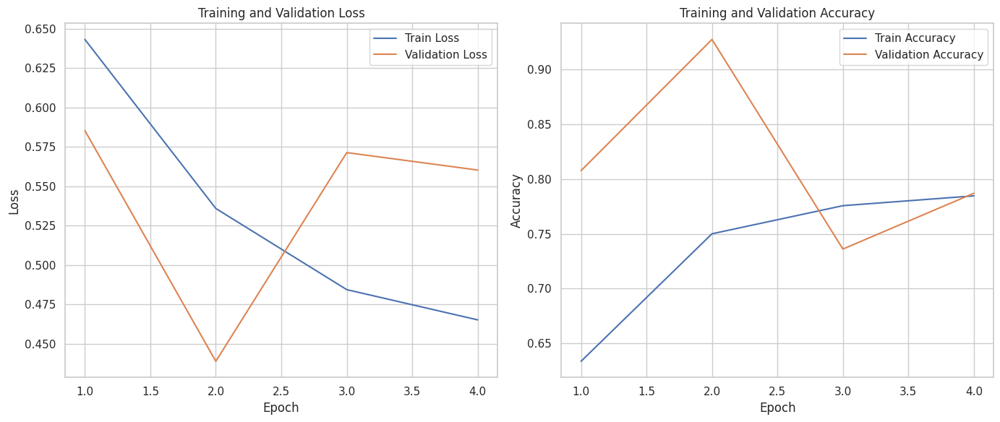

8/8 [==============================] - 0s 5ms/step
Confusion Matrix:
 [[  6  22]
 [  5 200]]


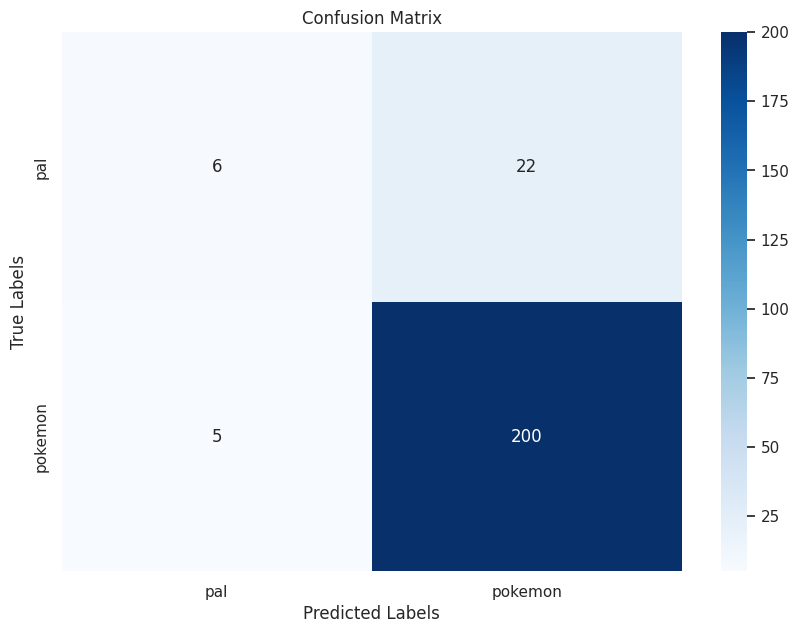

In [ ]:
one_hot_test_y = tf.keras.utils.to_categorical(test_y, 2)
# 評估模型
test_loss, test_acc = model.evaluate(scaled_blurred_test_X, one_hot_test_y)
print('Test accuracy:', test_acc)
loss_plot(history)
from sklearn.metrics import confusion_matrix

y_pred = model.predict(scaled_blurred_test_X)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(one_hot_test_y, axis=1)

# 计算混淆矩阵
cm = confusion_matrix(y_test_labels, y_pred_labels)

# 打印混淆矩阵
print("Confusion Matrix:\n", cm)

# 可视化混淆矩阵
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["pal", "pokemon"],
            yticklabels=["pal", "pokemon"])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


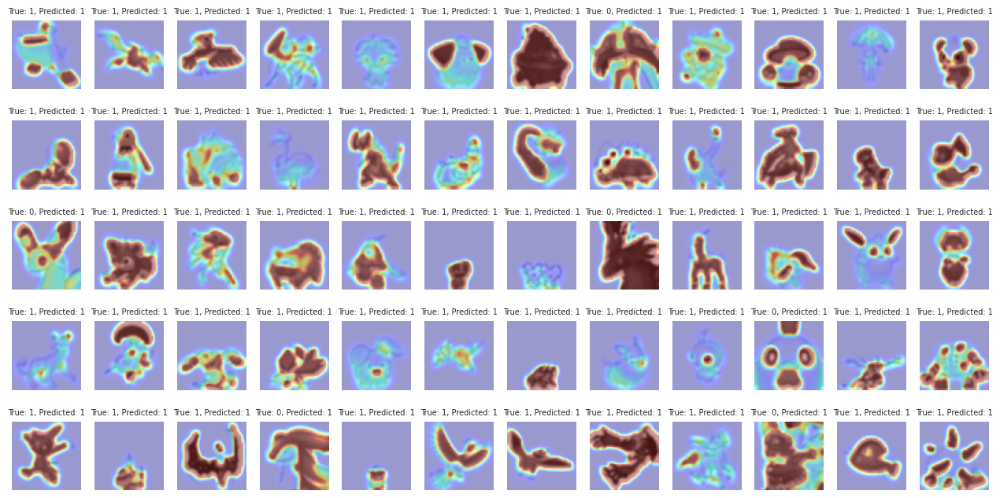

In [ ]:
plt.figure(figsize=(16, 8))
for i in range(5 * 12):
    img = scaled_blurred_test_X[i]
    img_array = np.expand_dims(img, axis=0)

    # 使用層索引獲取 Grad-CAM 熱力圖
    heatmap = get_gradcam_heatmap(model, img_array, layer_index=2)  # 替換成你要的層索引

    # 將熱力圖疊加到原始圖像上
    superimposed_img = superimpose_heatmap(img, heatmap)

    predictions = model.predict(img_array, verbose=False)
    predicted_label = np.argmax(predictions)
    true_label = y_test_labels[i]

    # 將圖像添加到網格中的適當位置
    plt.subplot(5, 12, i + 1)
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.title(f"True: {true_label}, Predicted: {predicted_label}", fontsize=7)

plt.tight_layout()
plt.show()


In [ ]:
wrong_index

array([False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False,  True, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False,  True, False, False, False,
        True,  True,

In [ ]:
np.where(y_pred_labels != y_test_labels)[0].shape

array([  7,  24,  31,  45,  51,  57,  68,  79,  89, 118, 122, 126, 127,
       129, 141, 143, 147, 150, 154, 159, 166, 169, 173, 208, 213, 215,
       228])

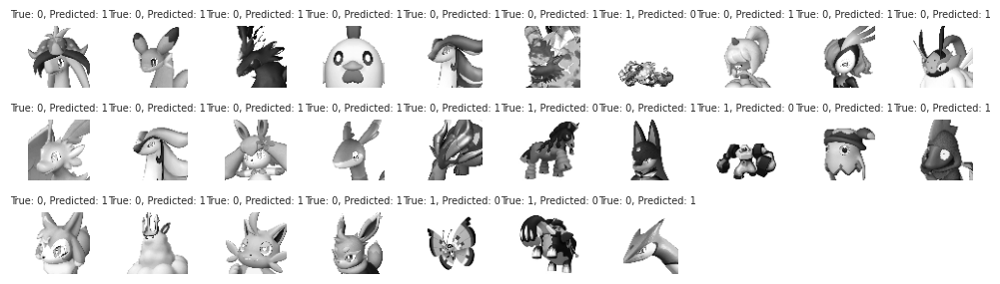

In [ ]:
wrong_index = np.where(y_pred_labels != y_test_labels)[0]

plt.figure(figsize=(10,3 ))
for i, wrong_ind in enumerate(wrong_index):
    img = test_X[wrong_ind]
    plt.subplot(3, 10, i + 1)
    plt.imshow(img, cmap="gray")
    true_label = y_test_labels[wrong_ind]
    predicted_label = y_pred_labels[wrong_ind]
    plt.title(f"True: {true_label}, Predicted: {predicted_label}", fontsize=7)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
def define_autoencoder(input_shape=(64, 64, 1)):

    input_img = Input(shape=input_shape)

    # 編碼器
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(4, (3, 3), activation='relu', padding='same')(x)
    encoded = MaxPooling2D((2, 2), padding='same')(x)

    # 解码器
    x = Conv2D(4, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    autoencoder = Model(input_img, decoded)

    return autoencoder, encoded, decoded



In [ ]:
# 编码器
input_shape = (64, 64, 1)
input_img = Input(shape=input_shape)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(4, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# 解码器
x = Conv2D(4, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# 自编码器模型
autoencoder = Model(input_img, decoded)

autoencoder.compile(optimizer='adam', loss='mse')

# 打印模型摘要
autoencoder.summary()

# 确保数据在 [0, 1] 范围内

# train autoencoder
callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                        patience=2,
                        restore_best_weights=True)]

history = autoencoder.fit(scaled_blurred_train_X, scaled_blurred_train_X,
              epochs=100,
              batch_size=50,
              #verbose=0,
              callbacks=callbacks,
              shuffle=True,
              validation_split=0.2)



Model: "model_191"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d_37 (Conv2D)          (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 32, 32, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_38 (Conv2D)          (None, 32, 32, 4)         1156      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 16, 16, 4)         0         
 ng2D)                                                           
                                                                 
 conv2d_39 (Conv2D)          (None, 16, 16, 4)         14

In [ ]:
# 準備所有的X
blurred_X_list = []
for img in X:
    blurred_X_list.append(cv2.GaussianBlur(img, (5, 5), 0))
blurred_X = np.array(blurred_X_list)
scaled_blured_X = blurred_X/255

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
# cosine_sim_matrix
encoder = Model(input_img, encoded)
latent = encoder.predict(scaled_blured_X)
latent = latent.reshape(latent.shape[0], latent.shape[1]*latent.shape[2]*latent.shape[3])
cosine_sim_matrix = cosine_similarity(latent)

triu_cosine_sim_matrix = np.triu(cosine_sim_matrix, 1)
flattened = triu_cosine_sim_matrix.flatten()
rows = triu_cosine_sim_matrix.shape[0]
cols = triu_cosine_sim_matrix.shape[1]
row_indices = np.repeat(np.arange(rows), cols)
col_indices = np.tile(np.arange(cols), rows)
result = pd.DataFrame({'sim': flattened,
             'row_ind': row_indices,
             'col_ind': col_indices})

result = result.loc[result.sim > 0, :]
result["row_label"] = y[result.row_ind]
result["col_label"] = y[result.col_ind]


37/37 [==============================] - 0s 3ms/step


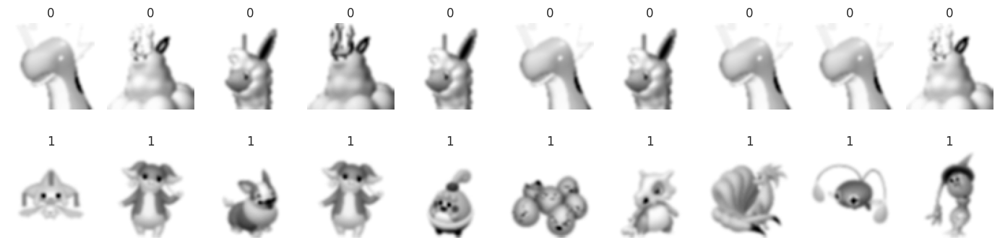

In [ ]:
#top10_sim = result.sort_values(by="sim", ascending=False).head(10).reset_index()
top10_sim = result.loc[result.row_label != result.col_label, :].sort_values(by="sim", ascending=False).head(10).reset_index()

fig, axs = plt.subplots(2, 10, figsize=(14, 4))
for i in top10_sim.index:
    index1 = top10_sim.loc[i, "row_ind"]
    index2 = top10_sim.loc[i, "col_ind"]
    axs[0][i].imshow(blurred_X[index1].reshape(64, 64), cmap='gray')
    axs[0][i].set_title(y[index1])
    axs[0][i].axis('off')

    axs[1][i].imshow(blurred_X[index2].reshape(64, 64), cmap='gray')
    axs[1][i].set_title(y[index2])
    axs[1][i].axis('off')
plt.tight_layout()

In [ ]:
cmap = ['#EE8855', '#5588EE'] # 红色和蓝色

def label_to_color(label):
    return cmap[label]

row_colors = np.vectorize(label_to_color)(y)

sns.clustermap(latent, cmap="Blues",
        row_colors=row_colors, col_colors=row_colors)

In [ ]:
from sklearn.cluster import KMeans

# 假設您希望將數據分為 3 個群集
num_clusters = 3

# 創建 KMeans 聚類器
kmeans = KMeans(n_clusters=num_clusters, random_state=42)

# 在潛在表示上擬合 KMeans 模型
cluster_labels = kmeans.fit_predict(latent_flat)

# 打印每個樣本的聚類標籤
print("Cluster labels:", cluster_labels)

<Axes: >

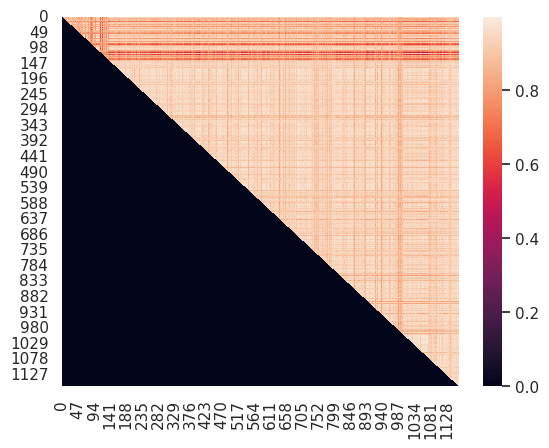

In [ ]:
sns.heatmap(triu_cosine_sim_matrix)

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


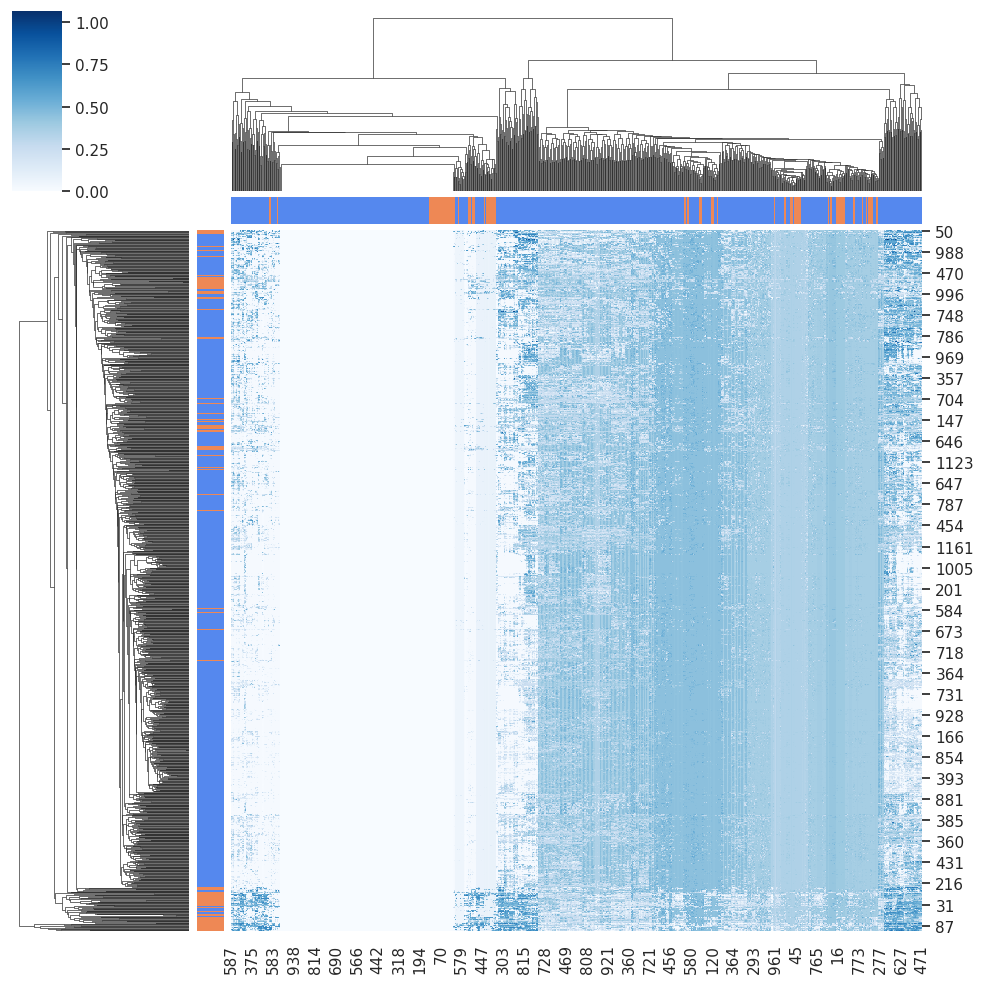

In [ ]:
cmap = ['#EE8855', '#5588EE'] # 红色和蓝色

def label_to_color(label):
    return cmap[label]

row_colors = np.vectorize(label_to_color)(y)

sns.clustermap(latent, cmap="Blues",
        row_colors=row_colors, col_colors=row_colors)


/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

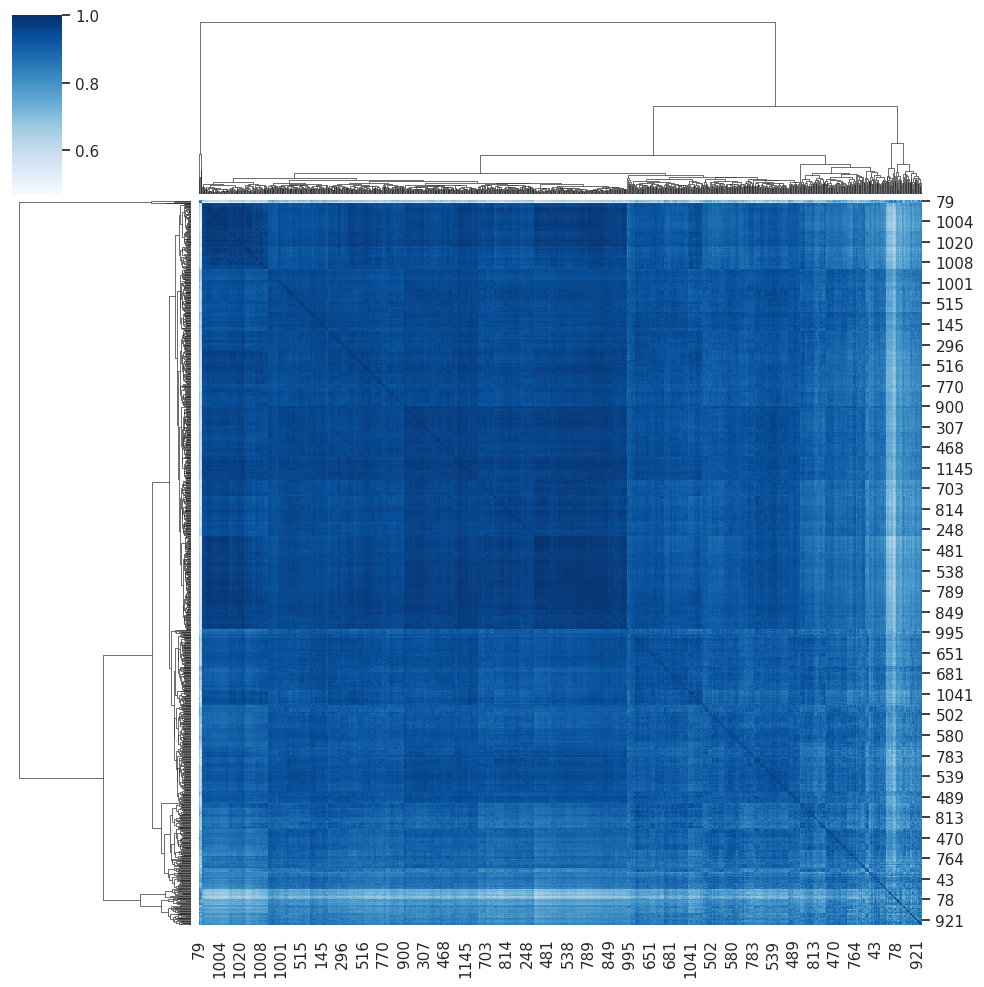

In [ ]:
cluster_map = sns.clustermap(cosine_sim_matrix, cmap="Blues")
row_dendrogram = cluster_map.dendrogram_row.reordered_ind
col_dendrogram = cluster_map.dendrogram_col.reordered_ind
#clustered_data = cosine_sim_matrix.iloc[row_dendrogram, col_dendrogram]

# 可視化熱圖和分群結果
plt.figure(figsize=(10, 7))
sns.heatmap(clustered_data, cmap="Blues", annot=True, fmt=".2f", linewidths=.5)
plt.title("Clustered Cosine Similarity Matrix")
plt.show()

In [ ]:
mport numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.datasets import make_blobs

# 計算層次聚類
Z = linkage(cosine_sim_matrix, method='ward', metric='euclidean')

# 繪製層次聚類樹狀圖
plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

# 根據層次聚類結果切分數據
max_d = 5  # 指定最大距離來切分分群
clusters = fcluster(Z, max_d, criterion='distance')

# 打印分群結果
num_clusters = len(np.unique(clusters))
print(f"Number of clusters: {num_clusters}")
print("Cluster labels:", clusters)

# 可視化分群結果
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap='viridis', edgecolor='k')
plt.title('Hierarchical Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Cluster')
plt.show()

79

In [ ]:
row_dendrogram[row_dendrogram == 1]

79

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [ 68,  69,  70, ..., 173, 172, 171],
       [ 71,  72,  74, ..., 179, 178, 179],
       [ 76,  75,  77, ..., 185, 184, 182]], dtype=uint8)
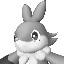

In [ ]:

# 高斯模糊
from tensorflow.keras.callbacks import EarlyStopping

model = define_model()
onehot_y = tf.keras.utils.to_categorical(y, 2)

# 高斯前處理
blurred_X = []
for img in X:
    blurred_X.append(cv2.GaussianBlur(img, (5, 5), 0))
blurred_X = np.array(blurred_X)
blurred_X = blurred_X/255

# 分割成8:2
#X_train, X_test, y_train, y_test = train_test_split(blurred_X, onehot_y, test_size=0.2, random_state=42)

# 訓練模型
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=10, batch_size=50, validation_split=0.1, callbacks=[early_stopping])

# 評估模型
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)

loss_plot(history)

In [ ]:
print((y == 0).sum()) # pokemon
print((y == 1).sum()) # pal

906
139


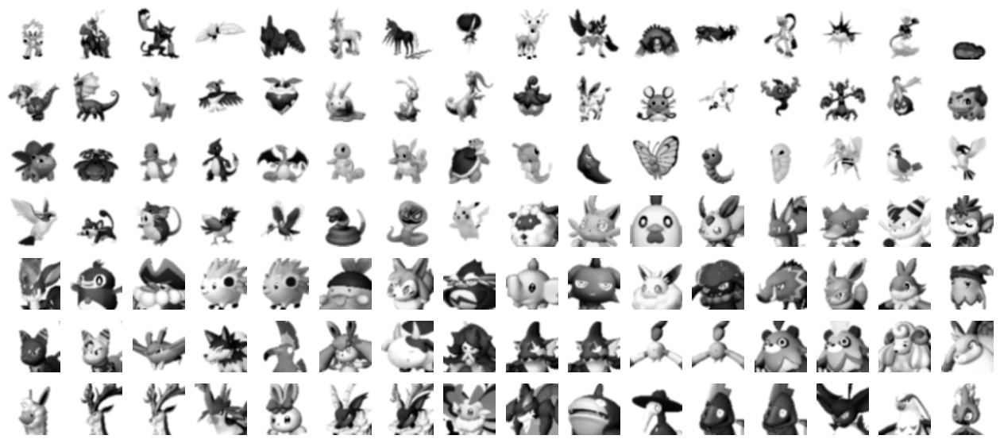

In [ ]:
# 高斯模糊
fig, ax = plt.subplots(7, 16, figsize=(16, 7))
start_ind = 850
for i in range(7):
    for j in range(16):
        img = X[start_ind + i*16 + j]
        blurred = cv2.GaussianBlur(img, (5, 5), 0)
        ax[i][j].imshow(blurred, cmap='gray')
        ax[i][j].axis('off')

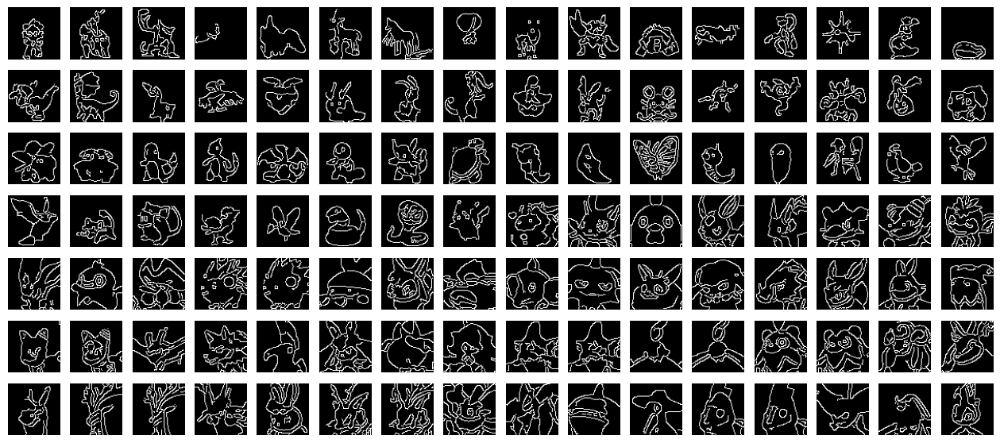

In [ ]:
# edges
def get_edges(img):
    blurred = cv2.GaussianBlur(img, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    return edges

fig, ax = plt.subplots(7, 16, figsize=(16, 7))
start_ind = 850
for i in range(7):
    for j in range(16):
        img = X[start_ind + i*16 + j]
        blurred = cv2.GaussianBlur(img, (5, 5), 0)
        edges = cv2.Canny(blurred, 50, 150)
        ax[i][j].imshow(edges, cmap='gray')
        ax[i][j].axis('off')

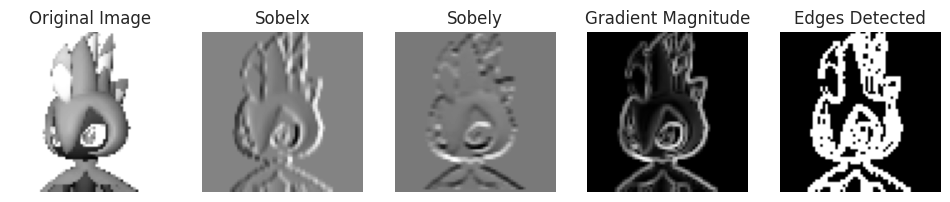

In [ ]:
# 展示邊緣提取
image = X[start_ind + i*16 + j]
sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

# 计算梯度幅值
gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

# 对梯度幅值进行阈值处理
threshold = 100
edges = np.where(gradient_magnitude > threshold, 255, 0).astype(np.uint8)

# 显示原始图像和处理后的边缘图像
plt.figure(figsize=(12, 6))

plt.subplot(1, 5, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 5, 2)
plt.imshow(sobelx, cmap='gray')
plt.title('Sobelx')
plt.axis('off')

plt.subplot(1, 5, 3)
plt.imshow(sobely, cmap='gray')
plt.title('Sobely')
plt.axis('off')

plt.subplot(1, 5, 4)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Gradient Magnitude')
plt.axis('off')

plt.subplot(1, 5, 5)
plt.imshow(edges, cmap='gray')
plt.title('Edges Detected')
plt.axis('off')

plt.show()

training set: 836, shape: (836, 64, 64)
testing set: 209, shape: (836, 2)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 31, 31, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 14, 14, 64)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 14, 14, 64)        0         
                                                

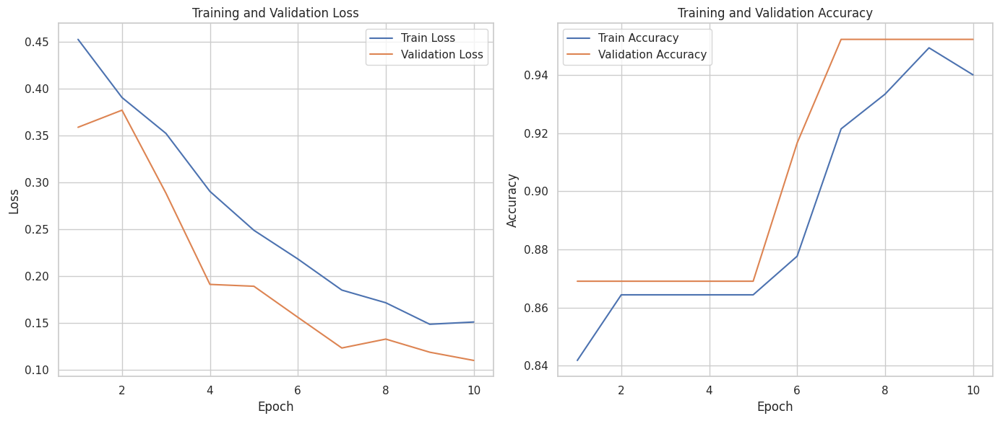

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

one_hot_y = tf.keras.utils.to_categorical(y, 2)

# 分割成8:2
X_train, X_test, y_train, y_test = train_test_split(X, one_hot_y, test_size=0.2, random_state=42)
X_train, X_test = X_train/255, X_test/255

print(f"training set: {len(X_train)}, shape: {X_train.shape}")
print(f"testing set: {len(X_test)}, shape: {y_train.shape}")
# define model
model = define_model()

# 訓練模型
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=10, batch_size=50, validation_split=0.1, callbacks=[early_stopping])

# 評估模型
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)

# 繪製loss
loss_plot(history)

In [ ]:

# 查看模型看得部分
plt.figure(figsize=(16, 8))
for i in range(5*12):
    img = X_test[i]
    img_array = np.expand_dims(img, axis=0)
    img_array = img_array / 255.0  # 如果你在训练时标准化了图像数据

    # 获取 Grad-CAM 热力图
    heatmap = get_gradcam_heatmap(model, img_array, "conv2d_1")

    # 将热力图叠加到原始图像上
    superimposed_img = superimpose_heatmap(img, heatmap)

    predictions = model.predict(img_array, verbose=False)
    predicted_label = np.argmax(predictions)
    true_label = np.argmax(y_test[i])

    # 将图像添加到网格中的适当位置
    plt.subplot(5, 12, i + 1)
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.title(f"True: {true_label}, Predicted: {predicted_label}", fontsize=7)

#plt.tight_layout()
plt.show()

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<1>; VDcn = cv::impl::{anonymous}::Set<3, 4>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)


<Figure size 1600x800 with 0 Axes>

7/7 [==============================] - 0s 2ms/step
Confusion Matrix:
 [[182   1]
 [ 15  11]]


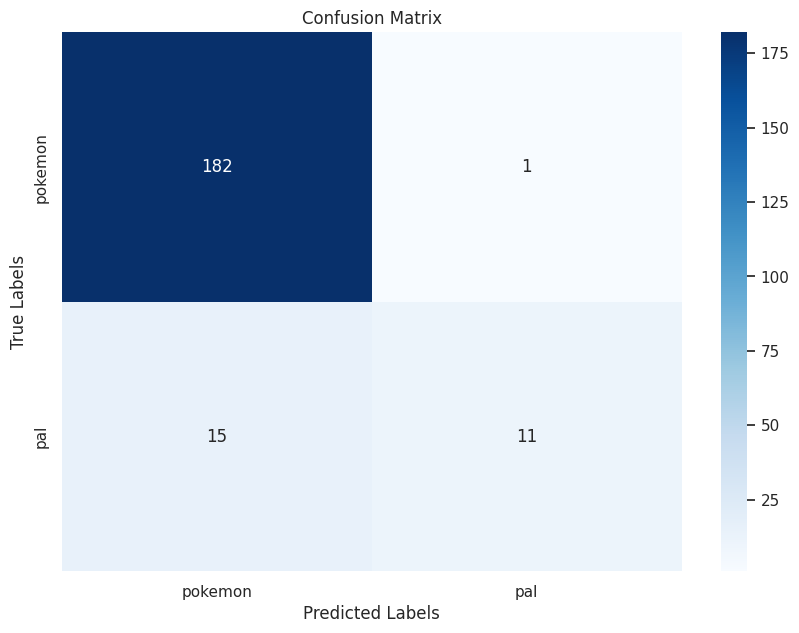

In [ ]:
from sklearn.metrics import confusion_matrix

y_pred = model.predict(X_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# 计算混淆矩阵
cm = confusion_matrix(y_test_labels, y_pred_labels)

# 打印混淆矩阵
print("Confusion Matrix:\n", cm)

# 可视化混淆矩阵
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["pokemon", "pal"],
            yticklabels=["pokemon", "pal"])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# 查看模型專注的部分
plt.figure(figsize=(15, 8))
for i in range(5*14):
    # 选择要处理的图像（假设从索引 100 开始）
    img = X_test[100+i]
    img_array = np.expand_dims(img, axis=0)
    img_array = img_array / 255.0  # 如果你在训练时标准化了图像数据

    # 获取 Grad-CAM 热力图
    heatmap = get_gradcam_heatmap(model, img_array, last_conv_layer_name)

    # 将热力图叠加到原始图像上
    superimposed_img = superimpose_heatmap(img, heatmap)

    # 将图像添加到网格中的适当位置
    plt.subplot(5, 14, i + 1)
    plt.imshow(superimposed_img)
    plt.axis('off')

plt.tight_layout()
plt.show()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_161 (Conv2D)         (None, 62, 62, 32)        320       
                                                                 
 max_pooling2d_76 (MaxPooli  (None, 31, 31, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_162 (Conv2D)         (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_77 (MaxPooli  (None, 14, 14, 64)        0         
 ng2D)                                                           
                                                                 
 dropout_12 (Dropout)        (None, 14, 14, 64)        0         
                                                                 
 flatten_17 (Flatten)        (None, 12544)            

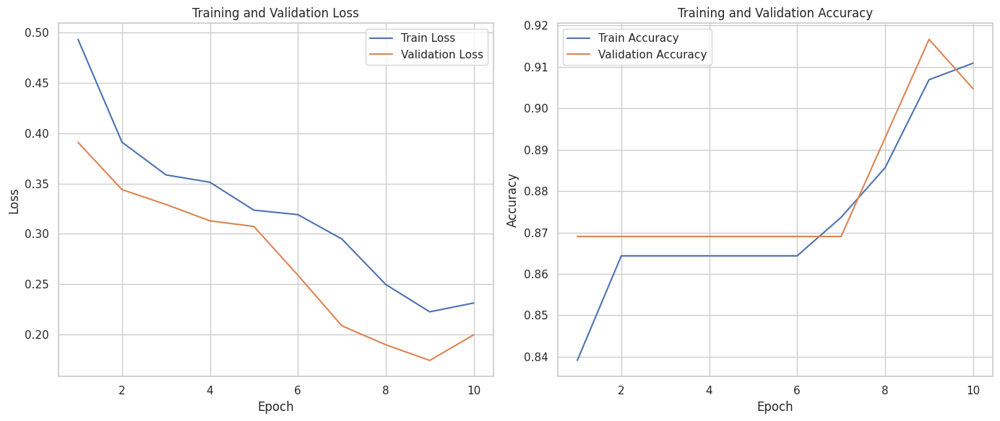

In [ ]:
# 高斯模糊
from tensorflow.keras.callbacks import EarlyStopping

model = define_model()
onehot_y = tf.keras.utils.to_categorical(y, 2)

# 高斯前處理
blurred_X = []
for img in X:
    blurred_X.append(cv2.GaussianBlur(img, (5, 5), 0))
blurred_X = np.array(blurred_X)
blurred_X = blurred_X/255

# 分割成8:2
X_train, X_test, y_train, y_test = train_test_split(blurred_X, onehot_y, test_size=0.2, random_state=42)

# 訓練模型
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=10, batch_size=50, validation_split=0.1, callbacks=[early_stopping])

# 評估模型
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)

loss_plot(history)

7/7 [==============================] - 0s 2ms/step
Confusion Matrix:
 [[183   0]
 [ 21   5]]


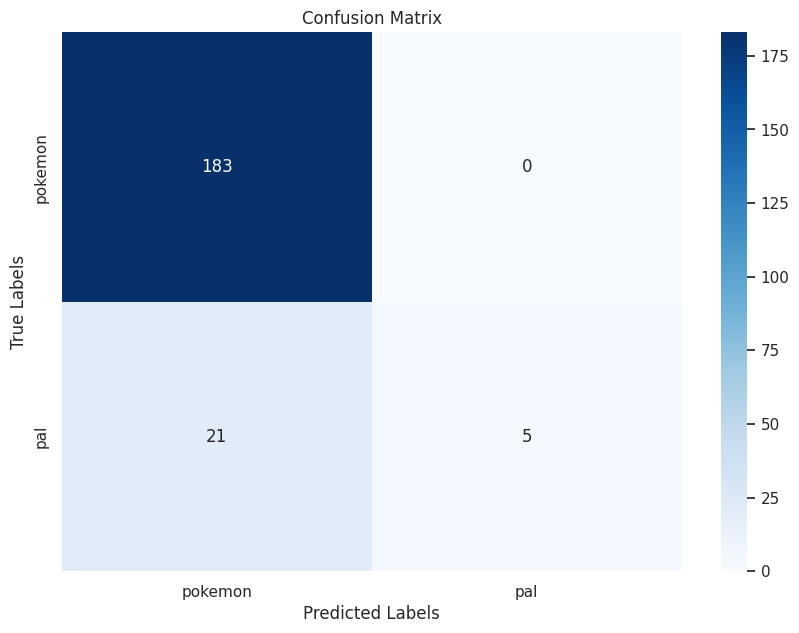

In [ ]:
y_pred = model.predict(X_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

from sklearn.metrics import confusion_matrix


# 计算混淆矩阵
cm = confusion_matrix(y_test_labels, y_pred_labels)

# 打印混淆矩阵
print("Confusion Matrix:\n", cm)

# 可视化混淆矩阵
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["pokemon", "pal"],
            yticklabels=["pokemon", "pal"])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

<ipython-input-102-6e7946293490>:80: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


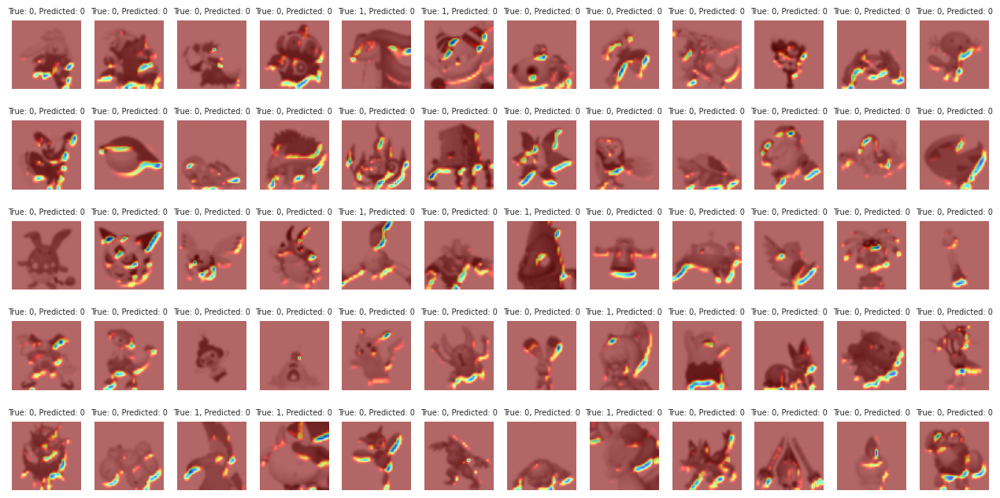

In [ ]:

plt.figure(figsize=(16, 8))
for i in range(5*12):
    img = X_test[i]
    img_array = np.expand_dims(img, axis=0)
    img_array = img_array / 255.0  # 如果你在训练时标准化了图像数据

    # 获取 Grad-CAM 热力图
    heatmap = get_gradcam_heatmap(model, img_array, "conv2d_29")

    # 将热力图叠加到原始图像上
    superimposed_img = superimpose_heatmap(img, heatmap)

    predictions = model.predict(img_array, verbose=False)
    predicted_label = np.argmax(predictions)
    true_label = np.argmax(y_test[i])
    # 将图像添加到网格中的适当位置
    plt.subplot(5, 12, i + 1)
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.title(f"True: {true_label}, Predicted: {predicted_label}", fontsize=7)


#plt.tight_layout()
plt.show()



In [ ]:
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# 找到被正确分类的索引
wrong_indices = np.where(y_pred_classes != y_true)[0]


# 找到被正确分类的索引
correct_indices = np.where(y_pred_classes == y_true)[0]

# 绘制一些被正确分类的图像
num_images = 10  # 想要显示的图像数量
plt.figure(figsize=(12, 6))

for i, correct in enumerate(correct_indices[:num_images]):
    plt.subplot(2, 5, i + 1)
    plt.imshow(X_test[correct].reshape(28, 28), cmap='gray', interpolation='none')
    plt.title(f"Pred: {y_pred_classes[correct]}, True: {y_true[correct]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

8/8 [==============================] - 0s 3ms/step


In [ ]:
len(wrong_indices)

12

In [ ]:
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# 找到被正确分类的索引
wrong_indices = np.where(y_pred_classes != y_true)[0]
len(wrong_indices)

7/7 [==============================] - 0s 4ms/step


18

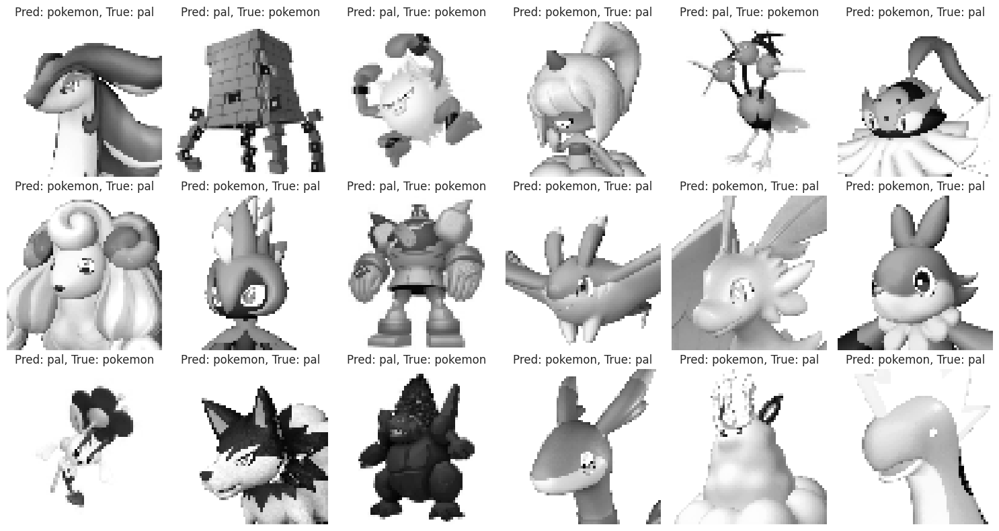

In [ ]:
map = {1:"pal", 0:"pokemon"}
plt.figure(figsize=(15, 8))

for i, wrong in enumerate(wrong_indices):
    plt.subplot(3, 6, i + 1)
    plt.imshow(X_test[wrong].reshape(64, 64), cmap='gray', interpolation='none')
    plt.title(f"Pred: {map[y_pred_classes[wrong]]}, True: {map[y_true[wrong]]}")
    plt.axis('off')
plt.tight_layout(pad=1.0)  # 增加子图之间的间距
plt.show()

In [ ]:
X_train

(836, 64, 64)

In [ ]:
decoded_imgs = autoencoder.predict(X_test_resized)
# 计算每个图像的MSE
mse_per_image = np.mean(np.square(X_test_resized - decoded_imgs), axis=(1, 2, 3))

# 计算所有图像的平均MSE
mean_mse = np.mean(mse_per_image)
print(mean_mse)

7/7 [==============================] - 0s 6ms/step
0.0006328651848201022


In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, UpSampling2D, Flatten, Reshape, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.datasets import mnist

# 编码器
input_shape = (64, 64, 1)
input_img = Input(shape=input_shape)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)

encoded = MaxPooling2D((2, 2), padding='same')(x)

# 解码器
x = Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# 自编码器模型
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

# 打印模型摘要
autoencoder.summary()

import numpy as np

# 确保数据在 [0, 1] 范围内
X_train = X_train.astype('float32') / 255.
X_test = X_test.astype('float32') / 255.

# 训练自编码器
history = autoencoder.fit(X_train, X_train,
               epochs=5,
               batch_size=1,
               shuffle=True,
               validation_data=(X_test, X_test),
               callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 16, 16, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 16, 16, 64)        3692

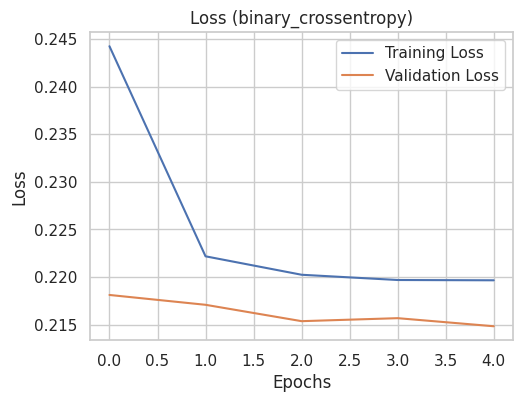

In [ ]:
# 绘制训练过程中的损失曲线
plt.figure(figsize=(12, 4))

# 绘制损失曲线
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss (binary_crossentropy)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model



X_train_expend = np.expand_dims(X_train, axis=-1)
X_test_expend = np.expand_dims(X_test, axis=-1)

# 编码器
input_shape = (64, 64, 1)
input_img = Input(shape=input_shape)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# 解码器
x = Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# 自编码器模型
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

# 打印模型摘要
autoencoder.summary()

# 训练自编码器
history = autoencoder.fit(X_train_expend, X_train_expend,
              epochs=50,
              batch_size=128,
              shuffle=True,
              validation_data=(X_test, X_test),
              callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])




Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 16, 16, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 16, 16, 64)        3692

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Dense, Reshape
from tensorflow.keras.models import Model

In [ ]:
# Function to build encoder
def build_encoder(input_shape, output_size):
    input_img = Input(shape=input_shape)

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Flatten()(x)
    encoded = Dense(output_size, activation='relu')(x)  # Output as 1D vector

    encoder = Model(input_img, encoded)
    return encoder

# Function to build decoder
def build_decoder(encoded_shape):
    encoded_input = Input(shape=(encoded_shape,))

    x = Dense(16 * 16 * 64, activation='relu')(encoded_input)  # Adjusted to match the encoder's output
    x = Reshape((16, 16, 64))(x)

    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)

    x = UpSampling2D((2, 2))(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)

    decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    decoder = Model(encoded_input, decoded)
    return decoder

# Build encoder and decoder
input_shape = (64, 64, 1)
encoder = build_encoder(input_shape, 2048)
decoder = build_decoder(2048)  # 64 is the output size of the encoder's Dense layer

# Connect encoder and decoder to form the autoencoder
autoencoder_input = Input(shape=input_shape)
encoded_img = encoder(autoencoder_input)
decoded_img = decoder(encoded_img)

autoencoder = Model(autoencoder_input, decoded_img)
autoencoder.compile(optimizer='adam', loss='mse')

# Print model summaries
encoder.summary()
decoder.summary()
autoencoder.summary()

X_train, X_test, y_train, y_test = train_test_split(blurred_X, onehot_y, test_size=0.2, random_state=42)
blurred_X_expend = np.expand_dims(blurred_X, axis=-1)
X_train_expend = np.expand_dims(X_train, axis=-1)
X_test_expend = np.expand_dims(X_test, axis=-1)
history = autoencoder.fit(blurred_X_expend, blurred_X_expend,
            epochs=100,
            batch_size=50,
            shuffle=True,
            validation_split=0.2,
            #validation_data=(X_test, X_test),)
            callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])
#loss_plot(history)

Model: "model_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, 64, 64, 1)]       0         
                                                                 
 conv2d_56 (Conv2D)          (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 32, 32, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_57 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 16, 16, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_12 (Flatten)        (None, 16384)             0  

### Autoencoder

In [ ]:
# 编码器
input_img = Input(shape=input_shape)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(4, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# 解码器
x = Conv2D(4, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# 自编码器模型
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

# 打印模型摘要
autoencoder.summary()

import numpy as np

# 确保数据在 [0, 1] 范围内

# train autoencoder
callbacks = [tf.keras.callbacks.EarlyStopping(monitor='loss',
                                              patience=2,
                                              restore_best_weights=True)]
history = autoencoder.fit(blurred_X, blurred_X,
                          epochs=100,
                          batch_size=50,
                          #verbose=0,
                          callbacks=callbacks)

                          #shuffle=True,
                          #validation_data=(X_test, X_test),
history = history.history

# 創建子圖
fig, ax = plt.subplots(figsize=(14, 6))

# 繪製損失圖
sns.lineplot(ax=ax, x=range(1, len(history['loss']) + 1), y=history['loss'], label='Train Loss')
ax.set_title('Training and Validation Loss')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.legend()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 32, 32, 4)         1156      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 16, 16, 4)         0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 16, 16, 4)         148 

NameError: name 'blurred_X' is not defined

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics.pairwise import cosine_similarity

latent = encoder.predict(blurred_X_expend)
latent = latent.reshape(latent.shape[0], latent.shape[1]*latent.shape[2]*latent.shape[3])
cosine_sim_matrix = cosine_similarity(latent)
triu_cosine_sim_matrix = np.triu(cosine_sim_matrix, 1)


flattened = triu_cosine_sim_matrix.flatten()

# 獲取原始矩陣的索引
rows = triu_cosine_sim_matrix.shape[0]
cols = triu_cosine_sim_matrix.shape[1]
row_indices = np.repeat(np.arange(rows), cols)
col_indices = np.tile(np.arange(cols), rows)

# 建立結果DataFrame
import pandas as pd
result = pd.DataFrame({'cos': flattened,
             'row_ind': row_indices,
             'col_ind': col_indices})

result = result.loc[result.cos > 0, :]

33/33 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


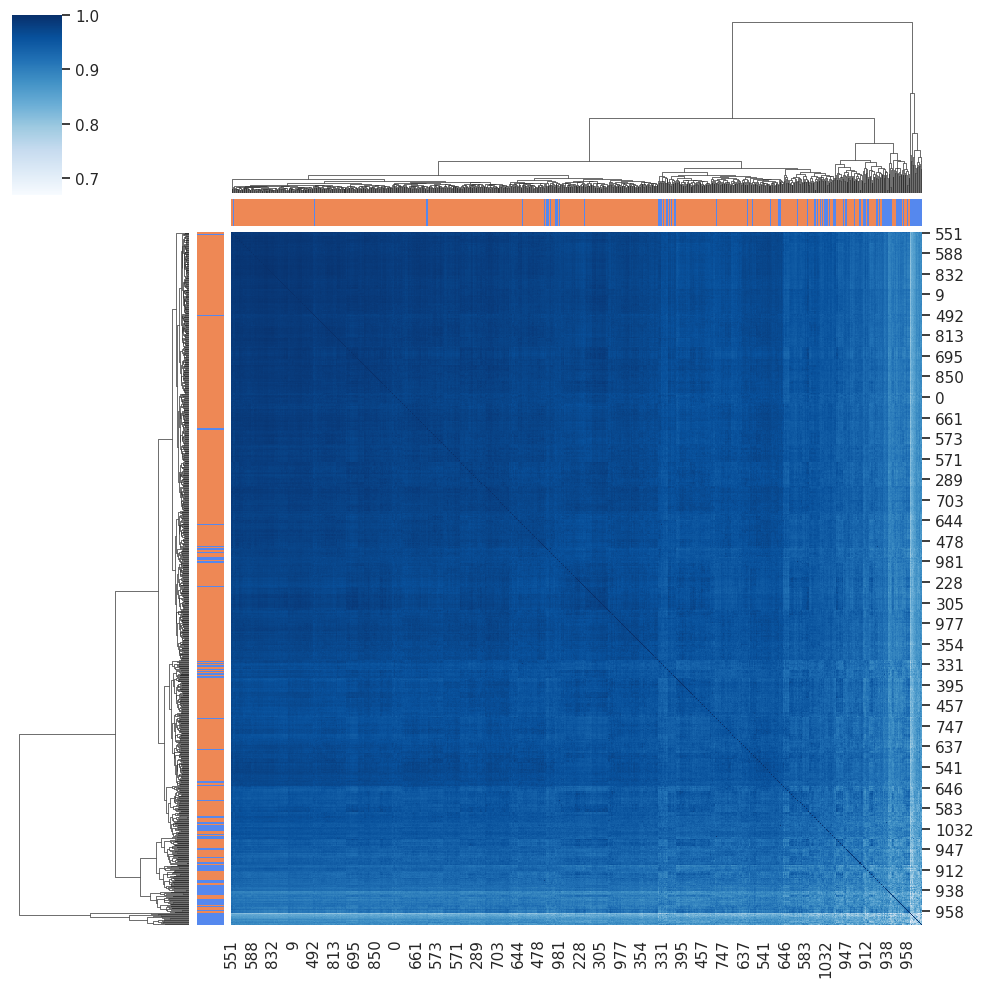

In [ ]:
X_flattened = X.reshape(1045, 64*64)
X_cosine_sim_matrix = cosine_similarity(X_flattened)
sns.clustermap(X_cosine_sim_matrix, cmap="Blues",
               row_colors=row_colors, col_colors=row_colors)

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


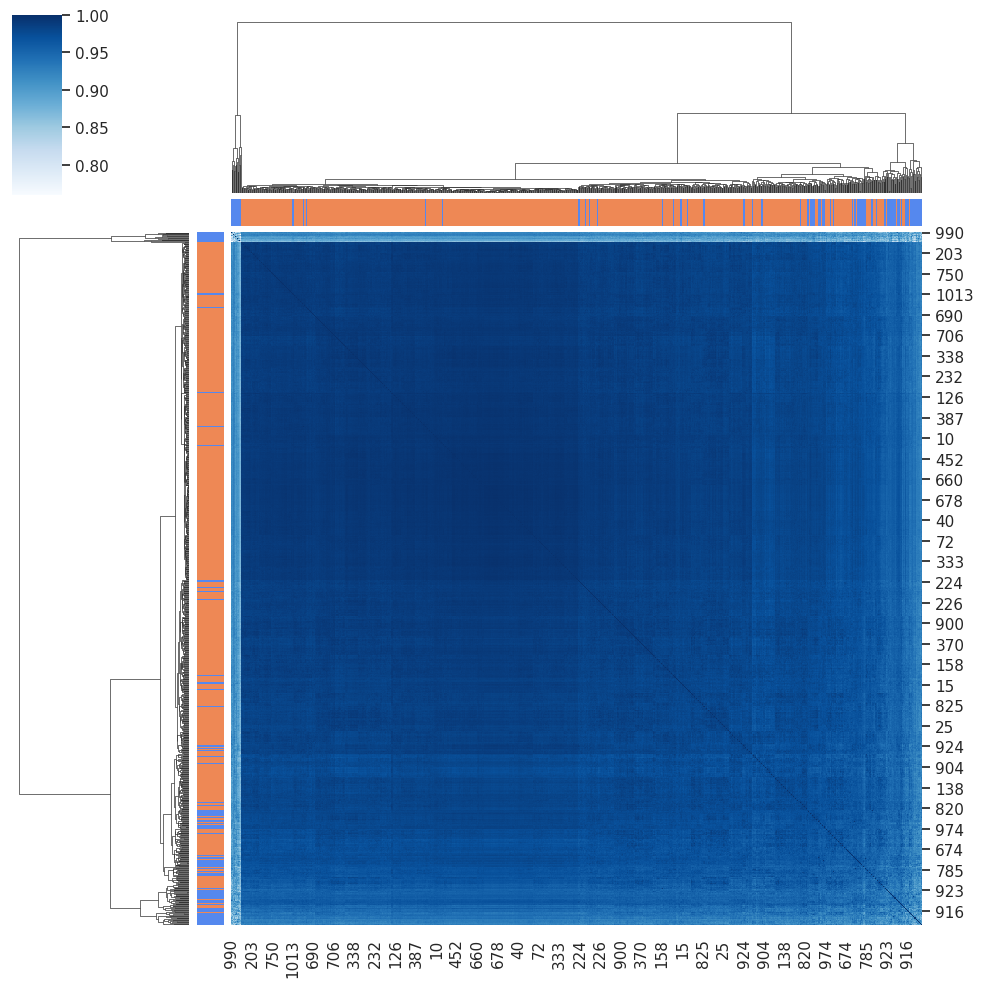

In [ ]:
cmap = ['#EE8855', '#5588EE'] # 红色和蓝色

def label_to_color(label):
    return cmap[label]

row_colors = np.vectorize(label_to_color)(y)

sns.clustermap(cosine_sim_matrix, cmap="Blues",
               row_colors=row_colors, col_colors=row_colors)

#sns.heatmap(triu_cosine_sim_matrix, cmap="Blues", row_colors=row_colors)

In [ ]:
X_flattened = X.reshape(1045, 64*64)
X_cosine_sim_matrix = cosine_similarity(X_flattened)

# 计算距离矩阵
distance_matrix = 1 - X_cosine_sim_matrix  # 由于相似矩阵是相似度，需要转换为距离矩阵
Z = linkage(distance_matrix, method='average')
dendrogram(Z)
max_d = 2.5  # 你可以根据树状图选择一个合适的阈值
clusters = fcluster(Z, max_d, criterion='distance')

In [ ]:
y

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
clusters

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# 假设 X_cosine_sim_matrix 是你的相似矩阵
# row_colors 是用于行颜色的颜色列表
X_flattened = X.reshape(1045, 64*64)
X_cosine_sim_matrix = cosine_similarity(X_flattened)

# 计算距离矩阵
distance_matrix = 1 - X_cosine_sim_matrix  # 由于相似矩阵是相似度，需要转换为距离矩阵

# 进行层次聚类
Z = linkage(squareform(distance_matrix), method='average')

# 绘制树状图（可选）
dendrogram(Z)

# 根据树状图提取聚类
max_d = 0.5  # 你可以根据树状图选择一个合适的阈值
clusters = fcluster(Z, max_d, criterion='distance')

# 将聚类结果应用于 clustermap
g = sns.clustermap(X_cosine_sim_matrix, cmap="Blues",
                   row_colors=row_colors, col_colors=row_colors,
                   row_linkage=Z, col_linkage=Z)

# 输出聚类结果
print("Clusters:", clusters)
plt.show()


ValueError: Distance matrix 'X' diagonal must be zero.

<Axes: >

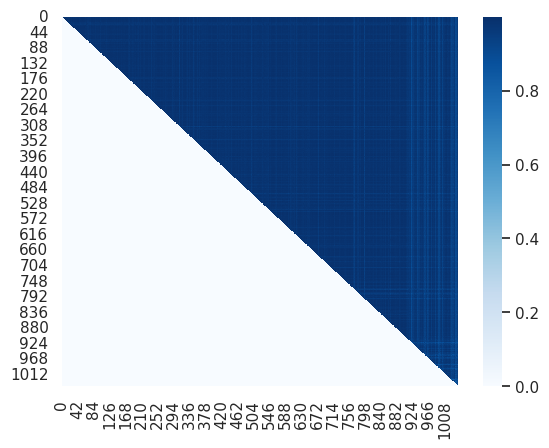

In [ ]:
sns.heatmap(triu_cosine_sim_matrix, cmap="Blues")

In [ ]:
# euclidean
euclidean_dist_matrix = euclidean_distances(latent)

triu_euclidean_dist_matrix = np.triu(euclidean_dist_matrix, 1)
flattened = triu_euclidean_dist_matrix.flatten()
rows = triu_euclidean_dist_matrix.shape[0]
cols = triu_euclidean_dist_matrix.shape[1]
row_indices = np.repeat(np.arange(rows), cols)
col_indices = np.tile(np.arange(cols), rows)
result = pd.DataFrame({'sim': flattened,
             'row_ind': row_indices,
             'col_ind': col_indices})

result = result.loc[result.sim > 0, :]
top10_sim = result.sort_values(by="sim", ascending=False).head(10).reset_index()
top10_sim

,index,sim,row_ind,col_ind
0,917484,7.354672,877,1019
1,264359,7.351299,252,1019
2,666684,7.347814,637,1019
3,210019,7.340166,200,1019
4,370949,7.327232,354,1019
5,789994,7.326435,755,1019
6,792084,7.324636,757,1019
7,269584,7.316313,257,1019
8,32369,7.298391,30,1019
9,807759,7.291451,772,1019


In [ ]:
# cosine_sim_matrix
cosine_sim_matrix = cosine_similarity(latent)

triu_cosine_sim_matrix = np.triu(cosine_sim_matrix, 1)
flattened = triu_cosine_sim_matrix.flatten()
rows = triu_cosine_sim_matrix.shape[0]
cols = triu_cosine_sim_matrix.shape[1]
row_indices = np.repeat(np.arange(rows), cols)
col_indices = np.tile(np.arange(cols), rows)
result = pd.DataFrame({'sim': flattened,
             'row_ind': row_indices,
             'col_ind': col_indices})

result = result.loc[result.sim > 0, :]
top10_sim = result.sort_values(by="sim", ascending=False).head(10).reset_index()
top10_sim



,index,sim,row_ind,col_ind
0,1090979,0.999876,1043,1044
1,788757,0.999668,754,827
2,746884,0.999586,714,754
3,264167,0.999542,252,827
4,791892,0.999530,757,827
5,131379,0.999520,125,754
6,788753,0.999510,754,823
7,131452,0.999495,125,827
8,688437,0.999480,658,827
9,860862,0.999460,823,827


array([[255, 255, 255, ..., 255, 201, 105],
       [255, 255, 255, ...,  84, 106, 107],
       [255, 255, 255, ..., 114, 110, 106],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)
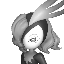

In [ ]:
X[1044]

array([[255, 255, 255, ..., 255, 211, 119],
       [255, 255, 255, ...,  92, 120, 120],
       [255, 255, 255, ..., 127, 122, 119],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)
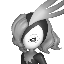

In [ ]:
X[1043]

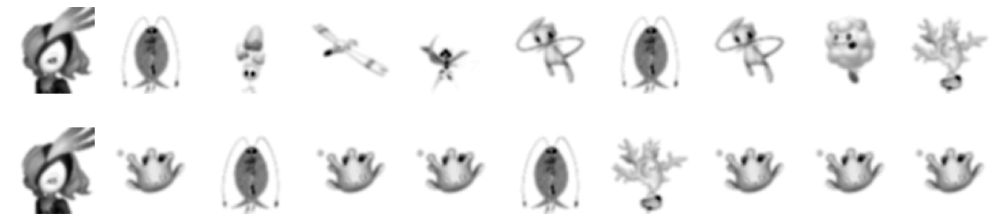

In [ ]:

fig, axs = plt.subplots(2, 10, figsize=(14, 4))
for i in top10_sim.index:
    index1 = top10_sim.loc[i, "row_ind"]
    index2 = top10_sim.loc[i, "col_ind"]
    axs[0][i].imshow(blurred_X_expend[index1].reshape(64, 64), cmap='gray')
    axs[0][i].axis('off')

    axs[1][i].imshow(blurred_X_expend[index2].reshape(64, 64), cmap='gray')

    axs[1][i].axis('off')
plt.tight_layout()


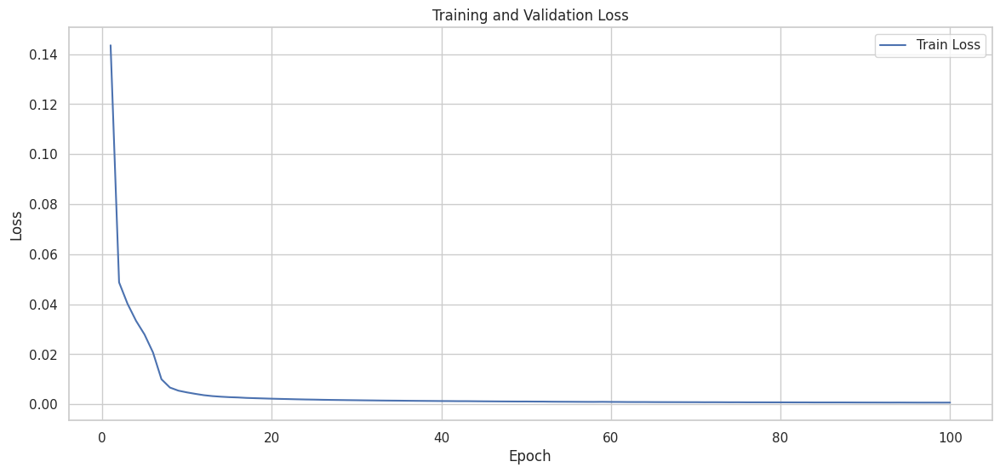

In [ ]:

# latent_representations.shape
#print(f"Latent representations shape: {latent_representations.shape}")
#y_test
#pd.DataFrame(latent_representations, columns=)


# 计算图像之间的欧氏距离

# 计算图像之间的余弦相似度


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster import hierarchy
from scipy.spatial import distance
from sklearn.metrics.pairwise import cosine_similarity

#latent_representations = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

# 計算餘弦相似度矩陣
cosine_sim_matrix = cosine_similarity(latent_representations)

# 計算階層式叢集
row_linkage = hierarchy.linkage(distance.pdist(latent_representations, metric='cosine'), method='complete')
col_linkage = hierarchy.linkage(distance.pdist(latent_representations.T, metric='cosine'), method='complete')

# 繪製熱力圖
sns.clustermap(cosine_sim_matrix, cmap="Blues",
               xticklabels=True, yticklabels=True,
               cbar_kws={'label': 'Cosine Similarity'},
               linewidths=0.5,
               linecolor='black',
               row_linkage=row_linkage,
               col_linkage=col_linkage)

plt.show()


ValueError: The condensed distance matrix must contain only finite values.

33/33 [==============================] - 0s 5ms/step


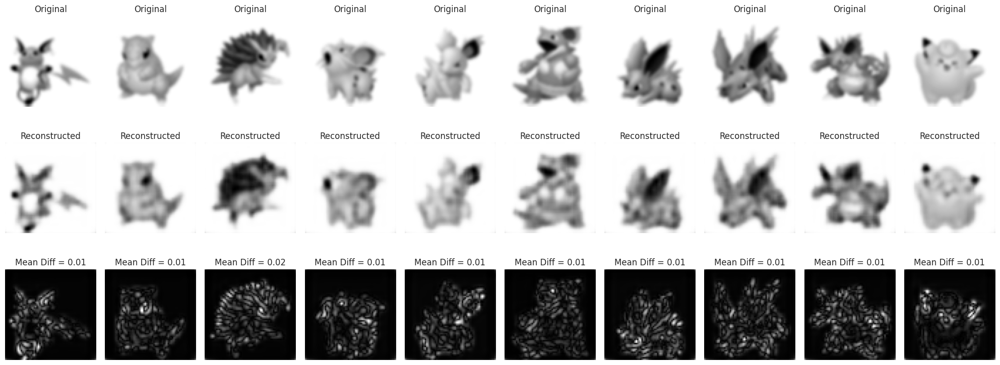

In [ ]:
# 可视化原始图像和重建图像
decoded_imgs = autoencoder.predict(blurred_X_expend)

diffs = np.abs(blurred_X_expend - decoded_imgs)

# 绘制三行图像
plt.figure(figsize=(20, 8))

n = 10  # 展示的图像数量

# 绘制原始图像
for i in range(n):
    plt.subplot(3, n, i + 1)
    plt.imshow(blurred_X_expend[i].reshape(64, 64), cmap='gray')
    plt.title("Original")
    #plt.gray()
    plt.axis('off')

# 绘制重建图像
for i in range(n):
    plt.subplot(3, n, i + n + 1)
    plt.imshow(decoded_imgs[i].reshape(64, 64), cmap='gray')
    plt.title("Reconstructed")
    #plt.gray()
    plt.axis('off')

# 绘制差异图像并标注差异数值
for i in range(n):
    plt.subplot(3, n, i + 2 * n + 1)
    diff_img = diffs[i].reshape(64, 64)
    plt.imshow(diff_img, cmap='gray')
    plt.title("Mean Diff = {:.2f}".format(diffs[i].mean()))
    #plt.gray()
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
group_colors = {1: 'red', 2: 'blue'}
y.map(group_colors)

AttributeError: 'numpy.ndarray' object has no attribute 'map'

In [ ]:

col_colors = pd.DataFrame([group_colors[group] for group in sample_groups], columns=['Group'])


array([0, 0, 0, ..., 1, 1, 1])

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


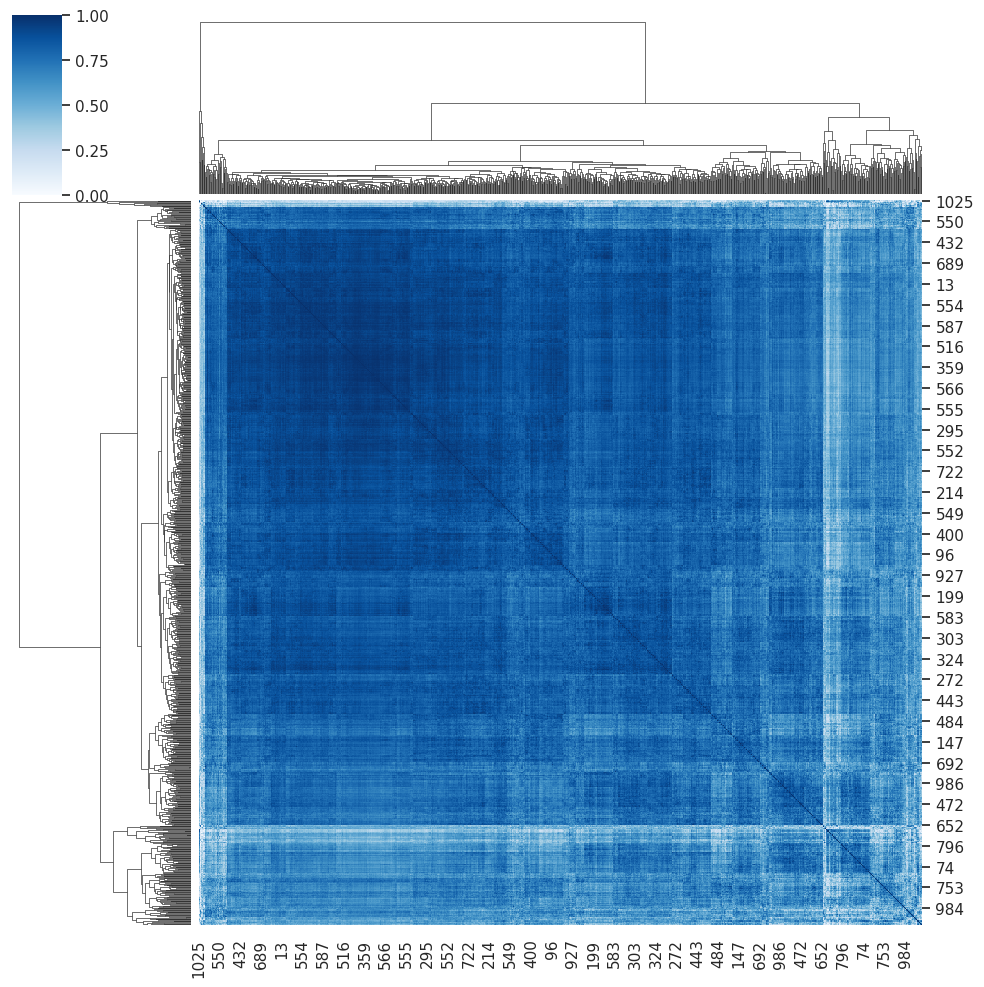

In [ ]:
sns.clustermap(cosine_sim_matrix, cmap="Blues")